# Basketball AI: Make or Miss - Jumpshot Detection

---

![3-second-violations-1](https://media.roboflow.com/notebooks/basketball-ai-make-or-miss-jumpshot-detection.png)

## Before you start

### Configure your API key

- Go to your [`Roboflow Settings`](https://app.roboflow.com/settings/api) page. Click `Copy`. This will place your private key in the clipboard.
- In Colab, go to the left pane and click on `Secrets` (🔑). Store Roboflow API Key under the name `ROBOFLOW_API_KEY`.

In [1]:
import os
from google.colab import userdata

os.environ["ROBOFLOW_API_KEY"] = userdata.get("ROBOFLOW_API_KEY")

### Select the runtime

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [2]:
!nvidia-smi

Mon Jun  1 06:34:56 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   45C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

**NOTE:** To make it easier for us to manage datasets, images and models we create a `HOME` constant.

In [3]:
import os

HOME = os.getcwd()
print("HOME:", HOME)

HOME: /content


### Install dependencies

**Note:** These commands install all the libraries required for this notebook. The `gdown` library is used to download example data from Google Drive. We use `inference-gpu` to run RF-DETR for player detection and a keypoint detection model for basketball court key points on GPUs. The `supervision` library is used to parse, process, and visualize model results, and the `sports` package provides basketball-specific utilities for analytics. This setup ensures you have everything needed for player detection, keypoint detection, and basketball analytics on GPU.

In [4]:
!pip install -q gdown
!pip install -q inference-gpu
!pip install -q git+https://github.com/roboflow/supervision.git
!pip install -q git+https://github.com/roboflow/sports.git@feat/basketball

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.7/105.7 kB 4.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.6/68.6 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.2/91.2 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.4/99.4 kB 9.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 5.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 3.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 33.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing me

**Note:** Set the ONNX Runtime execution provider to CUDA to ensure model inference runs on the GPU.

In [5]:
import os

os.environ["ONNXRUNTIME_EXECUTION_PROVIDERS"] = "[CUDAExecutionProvider]"

**Note:** Download the sample video file using `gdown`. This file will be used for testing player detection and tracking.

In [6]:
!gdown --folder https://drive.google.com/drive/folders/1eDJYqQ77Fytz15tKGdJCMeYSgmoQ-2-H
!gdown --folder https://drive.google.com/drive/folders/1RBjpI5Xleb58lujeusxH0W5zYMMA4ytO

Retrieving folder contents
Processing file 1GYxJGG8_OT5wlHxcYjUb62P2rjHeTg7p boston-celtics-new-york-knicks-game-1-q1-01.54-01.48.mp4
Processing file 1Gm-QSkfXngzEnkrQEdE1HsLPG3cU-KCV boston-celtics-new-york-knicks-game-1-q1-03.16-03.11.mp4
Processing file 1It3wz3eoGcjo6tI9OGUt3X69ZK6x5SNK boston-celtics-new-york-knicks-game-1-q1-04.28-04.20.mp4
Processing file 1hx7_rJAmgBjt6PgHH8wh49OwUh2Lhe9f boston-celtics-new-york-knicks-game-1-q1-04.44-04.39.mp4
Processing file 1fPEw_w51nNQeBHh_GYhRyThVg71V1trn boston-celtics-new-york-knicks-game-1-q1-05.13-05.09.mp4
Processing file 1zwnAE4jHVI0qH7ioDFnzX98XtOocAUbH boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4
Processing file 1wQMSO-C4jOm6BBIVUuJ_6Uqf0QLdbJHD boston-celtics-new-york-knicks-game-1-q1-07.41-07.34.mp4
Processing file 1w9e1zCZtXtOmi6C4m-1BJJzTpa3znkbB boston-celtics-new-york-knicks-game-1-q2-08.09-08.03.mp4
Processing file 1zaltcB_-j8Pzxh8rBuvAV2o0Ngf3IX0I boston-celtics-new-york-knicks-game-1-q2-08.43-08.38.mp4
Processing

In [7]:
from pathlib import Path

SOURCE_VIDEO_PATH = Path(HOME) / "boston-celtics-new-york-knicks-game-1/boston-celtics-new-york-knicks-game-1-q1-03.16-03.11.mp4"

### Imports

In [8]:
!pip uninstall -y pillow
!pip install -q pillow==10.4.0

Found existing installation: pillow 12.2.0
Uninstalling pillow-12.2.0:
  Successfully uninstalled pillow-12.2.0
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 45.1 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
inference-models 0.28.7 requires pillow<13.0.0,>=12.2.0, but you have pillow 10.4.0 which is incompatible.
inference-gpu 1.2.12 requires pillow<13.0.0,>=12.2.0, but you have pillow 10.4.0 which is incompatible.
gradio 5.50.0 requires starlette<1.0,>=0.40.0, but you have starlette 1.2.1 which is incompatible.
pointpats 2.5.5 requires shapely>=2.1, but you have shapely 2.0.7 which is incompatible.


In [10]:
!pip install -q ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 22.4 MB/s eta 0:00:00


In [9]:
import numpy as np
import supervision as sv

from tqdm import tqdm
from inference import get_model
from google.colab import userdata

from dataclasses import dataclass
from collections import deque
from typing import Union, Sequence, Optional, List

from sports import MeasurementUnit, ViewTransformer
from sports.basketball import (
    CourtConfiguration,
    League,
    draw_court,
    draw_made_and_miss_on_court,
    draw_points_on_court,
    ShotEventTracker,
    ShotEvent,
    ShotType
)

[transformers] `DepthProImageProcessorFast` is deprecated. The `Fast` suffix for image processors has been removed; use `DepthProImageProcessor` instead.
ModelDependencyMissing: Your `inference` configuration does not support YoloWorld model. Use pip install 'inference[yolo-world]' to install missing requirements.To suppress this warning, set CORE_MODEL_YOLO_WORLD_ENABLED to False.


## ball, player, referee and basket detection

**Note:** The model used in this notebook detects the following classes: `ball`, `ball-in-basket`, `player`, `player-in-possession`, `player-jump-shot`, `player-layup-dunk`, `player-shot-block`, `referee`, and `rim`. These classes enable tracking of game events, player actions, and ball location for basketball analytics.

In [11]:
from ultralytics import YOLO

PLAYER_DETECTION_MODEL = YOLO("/content/player-best.pt")

COLOR = sv.ColorPalette.from_hex([
    "#ffff00", "#ff9b00", "#ff66ff", "#3399ff", "#ff66b2", "#ff8080",
    "#b266ff", "#9999ff", "#66ffff", "#33ff99", "#66ff66", "#99ff00"
])

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.



0: 384x640 1 ball, 9 players, 1 player-jump-shot, 3 referees, 1 rim, 62.2ms
Speed: 3.1ms preprocess, 62.2ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


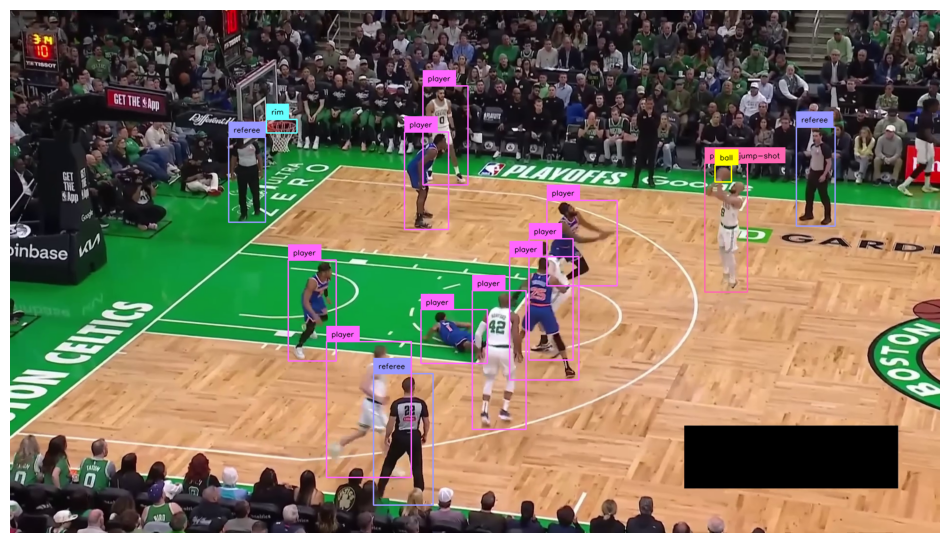

In [13]:
box_annotator = sv.BoxAnnotator(color=COLOR, thickness=2)
label_annotator = sv.LabelAnnotator(color=COLOR, text_color=sv.Color.BLACK)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=65, iterative_seek=True)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.predict(frame, conf=0.35)[0]
detections = sv.Detections.from_ultralytics(result)


annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(
    scene=annotated_frame,
    detections=detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections)

sv.plot_image(annotated_frame)

## detect action-classes
Exported for paper

In [14]:
PLAYER_DETECTION_MODEL.model.names

{0: 'ball',
 1: 'ball-in-basket',
 2: 'player',
 3: 'player-in-possession',
 4: 'player-jump-shot',
 5: 'player-layup-dunk',
 6: 'player-shot-block',
 7: 'referee',
 8: 'rim'}

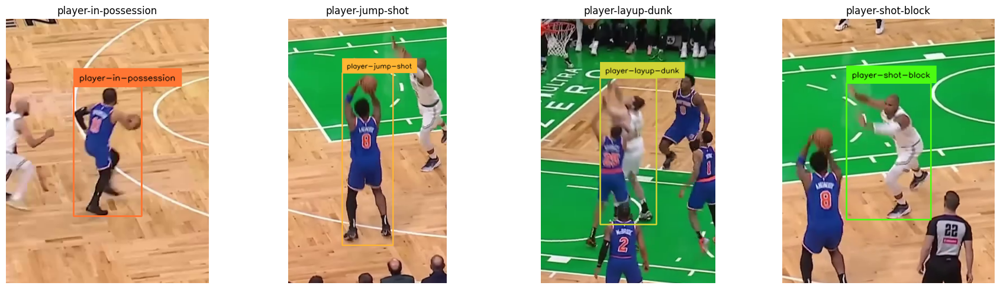

In [17]:
import supervision as sv
import cv2
import matplotlib.pyplot as plt
import numpy as np

# ----------------------------------------
# VIDEO SOURCES
# ----------------------------------------

VIDEO_1 = Path(HOME) / "boston-celtics-new-york-knicks-game-1/boston-celtics-new-york-knicks-game-1-q1-04.28-04.20.mp4"
VIDEO_2 = "/content/boston-celtics-new-york-knicks-game-1/boston-celtics-new-york-knicks-game-1-q1-03.16-03.11.mp4"

# Which classes to extract from each video
VIDEO_CLASS_MAPPING = {
    VIDEO_1: [3, 4, 6],
    VIDEO_2: [5]
}

class_map = {
    3: "player-in-possession",
    4: "player-jump-shot",
    5: "player-layup-dunk",
    6: "player-shot-block"
}

# ----------------------------------------
# ANNOTATORS
# ----------------------------------------

COLOR = sv.ColorPalette.DEFAULT

box_annotator = sv.BoxAnnotator(
    color=COLOR,
    thickness=2
)

label_annotator = sv.LabelAnnotator(
    color=COLOR,
    text_color=sv.Color.BLACK
)

# ----------------------------------------
# SETTINGS
# ----------------------------------------

PADDING = 120

# Store final annotated crops
class_crops = {}

# ----------------------------------------
# PROCESS EACH VIDEO
# ----------------------------------------

for video_path, target_classes in VIDEO_CLASS_MAPPING.items():

    frame_generator = sv.get_video_frames_generator(
        video_path,
        start=0,
        iterative_seek=True
    )

    for frame in frame_generator:

        result = PLAYER_DETECTION_MODEL.predict(
            frame,
            conf=0.35,
            verbose=False
        )[0]

        detections = sv.Detections.from_ultralytics(result)

        for xyxy, class_id in zip(
            detections.xyxy,
            detections.class_id
        ):

            if (
                class_id in target_classes
                and class_id not in class_crops
            ):

                x1, y1, x2, y2 = map(int, xyxy)

                # Add padding
                x1_pad = max(0, x1 - PADDING)
                y1_pad = max(0, y1 - PADDING)
                x2_pad = min(frame.shape[1], x2 + PADDING)
                y2_pad = min(frame.shape[0], y2 + PADDING)

                # Crop image
                crop = frame[
                    y1_pad:y2_pad,
                    x1_pad:x2_pad
                ].copy()

                # Shift bbox into crop coordinates
                shifted_xyxy = np.array([[
                    x1 - x1_pad,
                    y1 - y1_pad,
                    x2 - x1_pad,
                    y2 - y1_pad
                ]])

                crop_detection = sv.Detections(
                    xyxy=shifted_xyxy,
                    class_id=np.array([class_id])
                )

                labels = [class_map[class_id]]

                # Draw bbox
                annotated_crop = box_annotator.annotate(
                    scene=crop,
                    detections=crop_detection
                )

                # Draw label
                annotated_crop = label_annotator.annotate(
                    scene=annotated_crop,
                    detections=crop_detection,
                    labels=labels
                )

                # Convert for matplotlib
                annotated_crop = cv2.cvtColor(
                    annotated_crop,
                    cv2.COLOR_BGR2RGB
                )

                class_crops[class_id] = annotated_crop

        # Stop early if all classes from this video are found

# ----------------------------------------
# DISPLAY RESULTS
# ----------------------------------------

TARGET_CLASSES = [3, 4, 5, 6]

fig, axes = plt.subplots(
    1,
    len(TARGET_CLASSES),
    figsize=(18, 5)
)

if len(TARGET_CLASSES) == 1:
    axes = [axes]

for ax, class_id in zip(axes, TARGET_CLASSES):

    crop = class_crops.get(class_id)

    if crop is not None:
        ax.imshow(crop)
        ax.set_title(class_map[class_id])
    else:
        ax.set_title(f"{class_map[class_id]}\nNot found")

    ax.axis("off")

plt.tight_layout()
plt.show()

## detect jump-shots

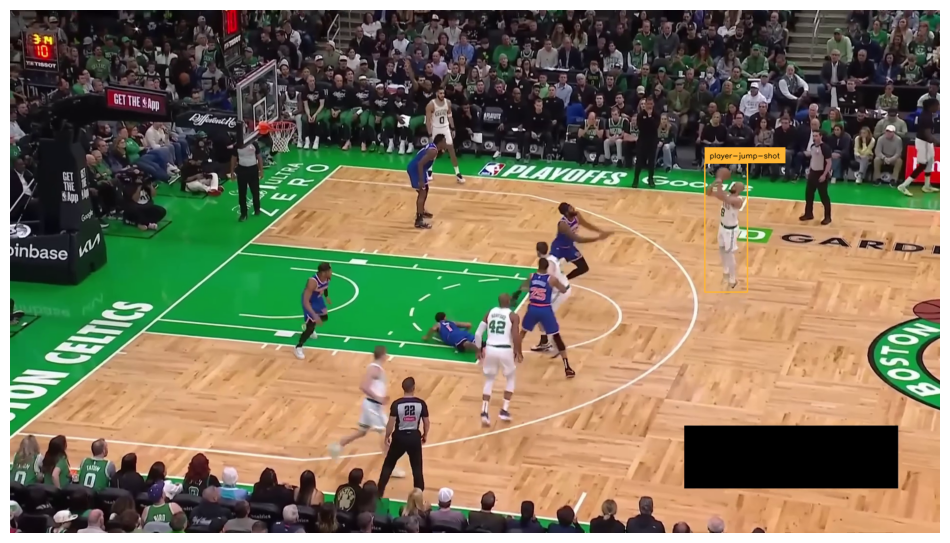

In [18]:
box_annotator = sv.BoxAnnotator(color=COLOR, thickness=2)
label_annotator = sv.LabelAnnotator(color=COLOR, text_color=sv.Color.BLACK)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=65, iterative_seek=True)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.predict(frame, conf=0.35)[0]
detections = sv.Detections.from_ultralytics(result)
detections = detections[detections.class_id == 4]

annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(
    scene=annotated_frame,
    detections=detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections)

sv.plot_image(annotated_frame)

## visualize jump-shots

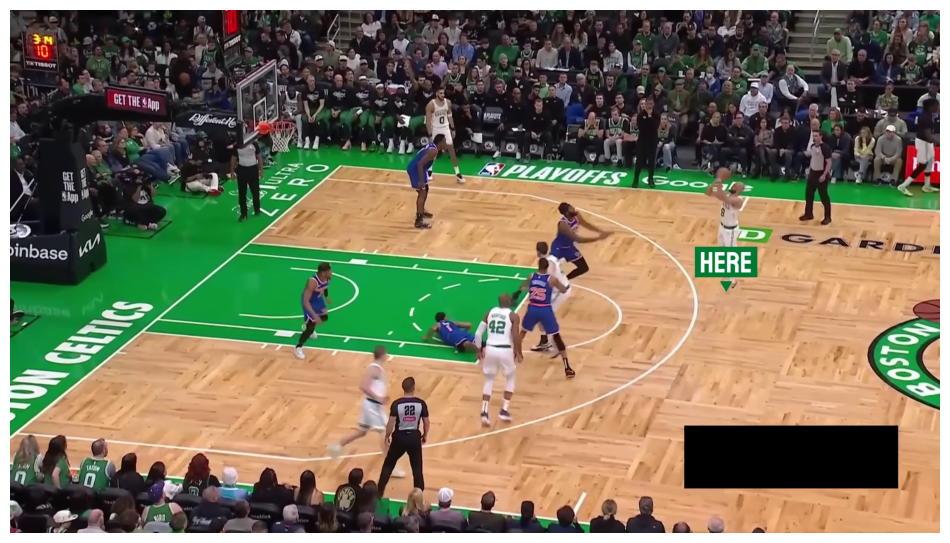

In [20]:
COLOR = sv.Color.from_hex('#007A33')
TEXT_COLOR = sv.Color.WHITE

triangle_annotator = sv.TriangleAnnotator(
    color=COLOR,
    base=25,
    height=21,
    color_lookup=sv.ColorLookup.INDEX
)
text_annotator = sv.RichLabelAnnotator(
    font_path=f"{HOME}/fonts/Staatliches-Regular.ttf",
    font_size=60,
    color=COLOR,
    text_color=TEXT_COLOR,
    text_offset=(0, -30),
    color_lookup=sv.ColorLookup.INDEX,
    text_position=sv.Position.TOP_CENTER
)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=65, iterative_seek=True)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.predict(frame, conf=0.35)[0]
detections = sv.Detections.from_ultralytics(result)
detections = detections[detections.class_id == 4]
xy = detections.get_anchors_coordinates(anchor=sv.Position.BOTTOM_CENTER)

# small hack to conver points into detections
xyxy = sv.pad_boxes(np.hstack((xy, xy)), px=1, py=1)
detections = sv.Detections(xyxy=xyxy)

labels = ["here"] * len(detections)

annotated_frame = frame.copy()
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=detections
)
annotated_frame = text_annotator.annotate(
    scene=annotated_frame,
    detections=detections,
    labels=labels
)

sv.plot_image(annotated_frame)

## detect basketball court keypoints

In [21]:
COURT_DETECTION_MODEL = YOLO("/content/court-best.pt")

MAGENTA_COLOR = sv.Color.from_hex('#FF1493')
CYAN_COLOR = sv.Color.from_hex('#00BFFF')


0: 384x640 1 court, 68.3ms
Speed: 2.7ms preprocess, 68.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


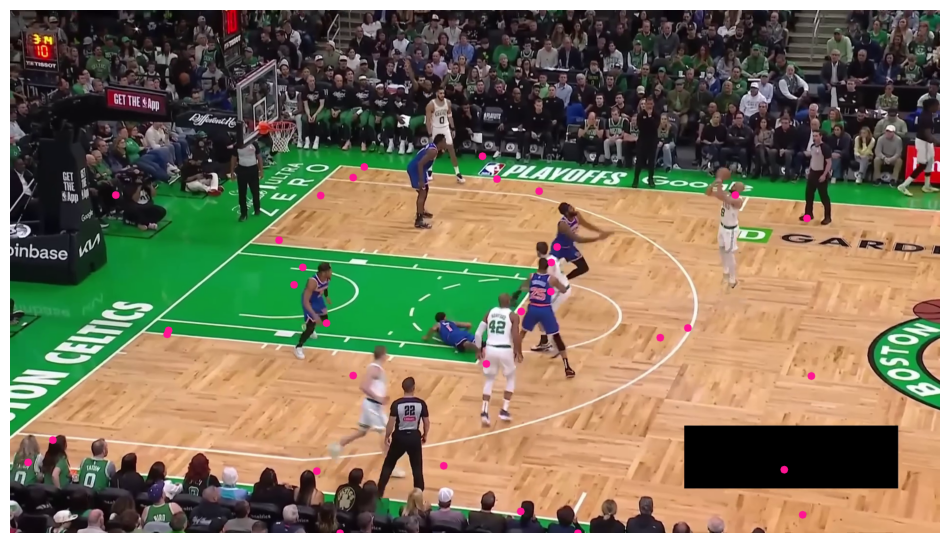

In [22]:
vertex_annotator = sv.VertexAnnotator(color=MAGENTA_COLOR, radius=8)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=65, iterative_seek=True)
frame = next(frame_generator)

result = COURT_DETECTION_MODEL.predict(frame, conf=0.3)[0]
key_points = sv.KeyPoints.from_ultralytics(result)

annotated_frame = frame.copy()
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=key_points)

sv.plot_image(annotated_frame)

## detect basketball court keypoints with high confidence


0: 384x640 1 court, 14.4ms
Speed: 3.2ms preprocess, 14.4ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


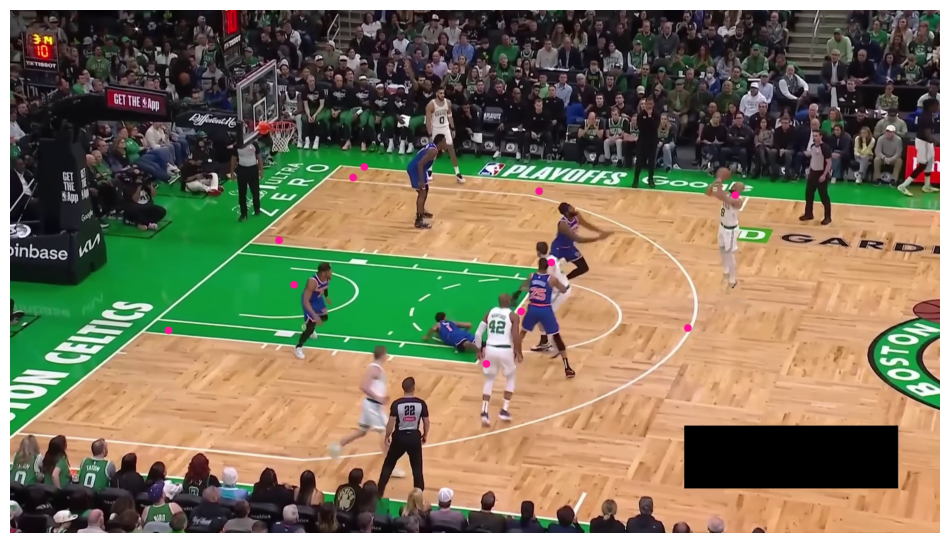

In [23]:
vertex_annotator = sv.VertexAnnotator(color=MAGENTA_COLOR, radius=8)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=65, iterative_seek=True)
frame = next(frame_generator)

result = COURT_DETECTION_MODEL.predict(frame, conf=0.3)[0]
key_points = sv.KeyPoints.from_ultralytics(result)
key_points = key_points[:, key_points.confidence[0] > 0.5]

annotated_frame = frame.copy()
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=key_points)

sv.plot_image(annotated_frame)

## mark jump-shot location


0: 384x640 1 court, 16.0ms
Speed: 3.3ms preprocess, 16.0ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


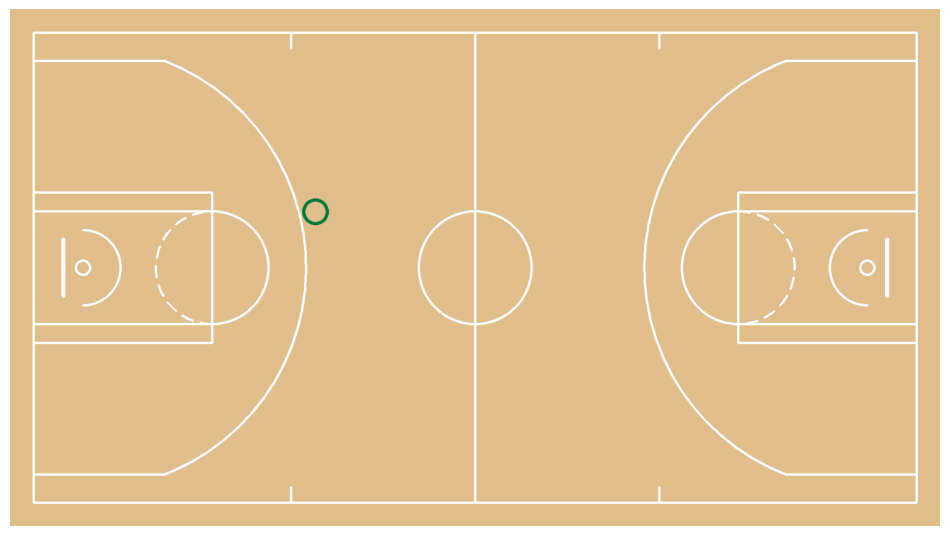

In [24]:
CONFIG = CourtConfiguration(league=League.NBA, measurement_unit=MeasurementUnit.FEET)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=65, iterative_seek=True)
frame = next(frame_generator)

# detect court keypoints
court_result = COURT_DETECTION_MODEL.predict(frame, conf=0.35)[0]
key_points = sv.KeyPoints.from_ultralytics(court_result)

keypoint_mask = key_points.confidence[0] > 0.5
have_enough_points = np.count_nonzero(keypoint_mask) >= 4

if have_enough_points:
    court_vertices_masked = np.array(CONFIG.vertices)[keypoint_mask]
    detected_on_image = key_points[:, keypoint_mask].xy[0]

    image_to_court = ViewTransformer(
        source=detected_on_image,
        target=court_vertices_masked,
    )

    # detect jump-shot
    result = PLAYER_DETECTION_MODEL.predict(frame, conf=0.35)[0]
    detections = sv.Detections.from_ultralytics(result)
    image_xy = detections[detections.class_id == 4].get_anchors_coordinates(anchor=sv.Position.BOTTOM_CENTER)

    if len(image_xy) > 0:
        court_xy = image_to_court.transform_points(points=image_xy)

        court = draw_made_and_miss_on_court(
            config=CONFIG,
            made_xy=court_xy,
            made_size=25,
            made_color=sv.Color.from_hex("#007A33"),
            made_thickness=6,
            line_thickness=4
        )

        sv.plot_image(court)

## detect shot events

In [25]:
SOURCE_VIDEO_PATH = Path(HOME) / "boston-celtics-new-york-knicks-game-1/boston-celtics-new-york-knicks-game-1-q1-04.28-04.20.mp4"

[{'event': 'START', 'frame': 176, 'type': 'JUMP'}]


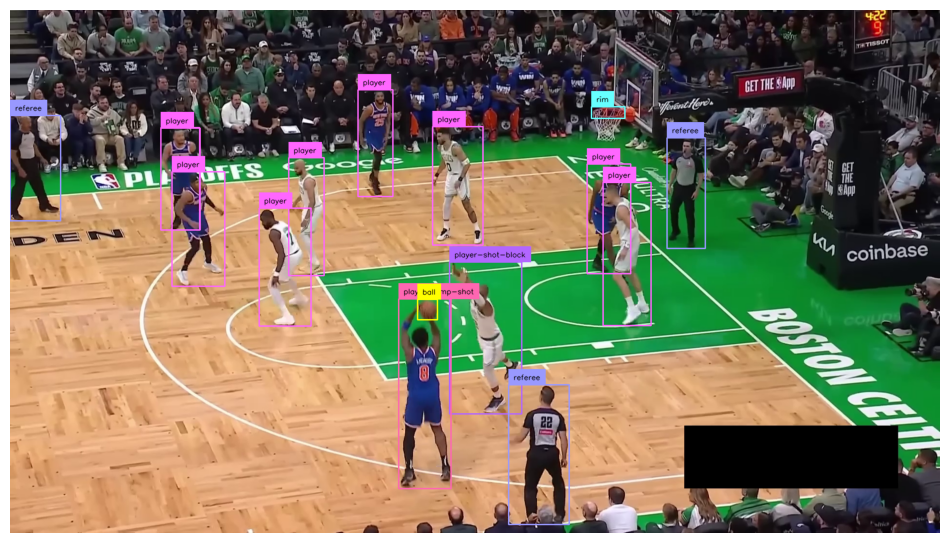

[{'event': 'MADE', 'frame': 223, 'type': 'JUMP'}]


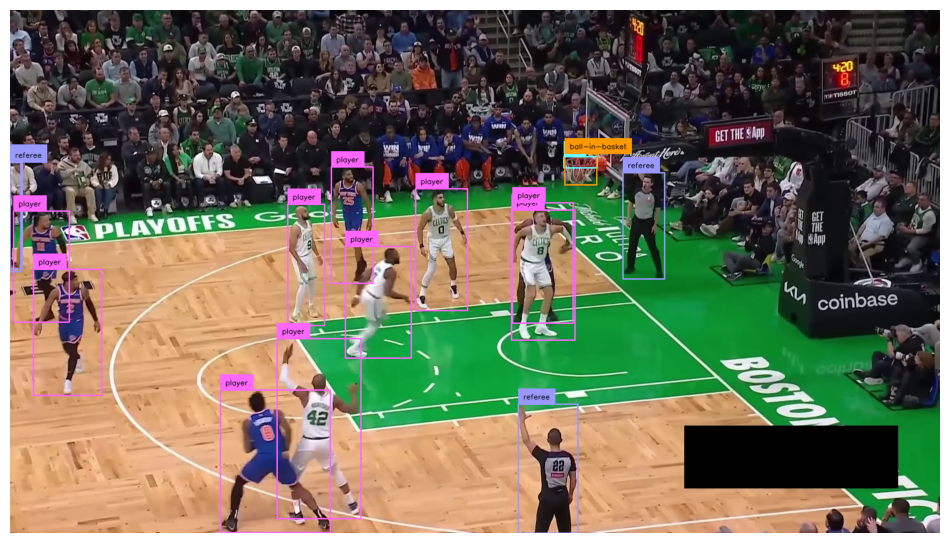

In [27]:
CONFIDENCE_THRESHOLD = 0.3
IOU_THRESHOLD = 0.7

BALL_IN_BASKET_CLASS_ID = 1
JUMP_SHOT_CLASS_ID = 4
LAYUP_DUNK_CLASS_ID = 5

COLOR = sv.ColorPalette.from_hex([
    "#ffff00", "#ff9b00", "#ff66ff", "#3399ff", "#ff66b2", "#ff8080",
    "#b266ff", "#9999ff", "#66ffff", "#33ff99", "#66ff66", "#99ff00"
])

box_annotator = sv.BoxAnnotator(color=COLOR, thickness=2)
label_annotator = sv.LabelAnnotator(color=COLOR, text_color=sv.Color.BLACK)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)

shot_event_tracker = ShotEventTracker(
    reset_time_frames=int(video_info.fps * 1.7),
    minimum_frames_between_starts=int(video_info.fps * 0.5),
    cooldown_frames_after_made=int(video_info.fps * 0.5),
)

for frame_index, frame in enumerate(frame_generator):
    result = PLAYER_DETECTION_MODEL.predict(
        frame,
        conf=CONFIDENCE_THRESHOLD,
        iou=IOU_THRESHOLD,
    )[0]
    detections = sv.Detections.from_ultralytics(result)

    has_jump_shot = len(detections[detections.class_id == JUMP_SHOT_CLASS_ID]) > 0
    has_layup_dunk = len(detections[detections.class_id == LAYUP_DUNK_CLASS_ID]) > 0
    has_ball_in_basket = len(detections[detections.class_id == BALL_IN_BASKET_CLASS_ID]) > 0

    events = shot_event_tracker.update(
        frame_index=frame_index,
        has_jump_shot=has_jump_shot,
        has_layup_dunk=has_layup_dunk,
        has_ball_in_basket=has_ball_in_basket,
    )

    if events:
        print(events)

        annotated_frame = frame.copy()
        annotated_frame = box_annotator.annotate(
            scene=annotated_frame,
            detections=detections)
        annotated_frame = label_annotator.annotate(
            scene=annotated_frame,
            detections=detections)

        sv.plot_image(annotated_frame)

## end-to-end multi-video processing

In [28]:
CONFIG = CourtConfiguration(league=League.NBA, measurement_unit=MeasurementUnit.FEET)

In [29]:
COLOR = sv.ColorPalette.from_hex(['#007A33', '#006BB6'])
TEXT_COLOR = sv.Color.WHITE

triangle_annotator = sv.TriangleAnnotator(
    color=COLOR,
    base=25,
    height=21,
    color_lookup=sv.ColorLookup.CLASS
)
text_annotator = sv.RichLabelAnnotator(
    font_path=f"{HOME}/fonts/Staatliches-Regular.ttf",
    font_size=60,
    color=COLOR,
    text_color=TEXT_COLOR,
    text_offset=(0, -30),
    color_lookup=sv.ColorLookup.CLASS,
    text_position=sv.Position.TOP_CENTER
)

triangle_annotator_missed = sv.TriangleAnnotator(
    color=sv.Color.from_hex("#850101"),
    base=25,
    height=21,
    color_lookup=sv.ColorLookup.CLASS
)
text_annotator_missed = sv.RichLabelAnnotator(
    font_path=f"{HOME}/fonts/Staatliches-Regular.ttf",
    font_size=60,
    color=sv.Color.from_hex("#850101"),
    text_color=TEXT_COLOR,
    text_offset=(0, -30),
    color_lookup=sv.ColorLookup.CLASS,
    text_position=sv.Position.TOP_CENTER
)

In [30]:
class KeyPointsSmoother:
    def __init__(self, length: int):
        self.length = length
        self.buffer = deque(maxlen=length)

    def update(
        self,
        xy: np.ndarray,
        confidence: Optional[np.ndarray] = None,
        conf_threshold: float = 0.0,
    ) -> np.ndarray:
        assert xy.ndim == 3 and xy.shape[0] == 1
        xy_f = xy.astype(np.float32, copy=True)

        if confidence is not None:
            assert confidence.shape[:2] == xy.shape[:2]
            mask = (confidence >= conf_threshold)[..., None]
            xy_f = np.where(mask, xy_f, np.nan)

        self.buffer.append(xy_f)
        stacked = np.stack(self.buffer, axis=0)

        if np.isnan(stacked).any():
            mean_xy = np.nanmean(stacked, axis=0)
        else:
            mean_xy = stacked.mean(axis=0)

        return mean_xy

In [31]:
@dataclass
class Shot:
    x: float
    y: float
    distance: float
    result: bool
    team: int

In [32]:
def euclidean_distance(
    start_point: Union[Sequence[float], np.ndarray],
    end_point: Union[Sequence[float], np.ndarray]
) -> float:
    start_point_array = np.asarray(start_point, dtype=float)
    end_point_array = np.asarray(end_point, dtype=float)

    if start_point_array.shape != (2,) or end_point_array.shape != (2,):
        raise ValueError("Both points must have shape (2,).")

    return float(np.linalg.norm(end_point_array - start_point_array))

def extract_made(shots: list[Shot]):
    return [shot for shot in shots if shot.result]

def extract_xy(shots: list[Shot]):
    return np.array([[shot.x, shot.y] for shot in shots], dtype=float)

def extract_class_id(shots: list[Shot]):
    return np.array([shot.team for shot in shots], dtype=int)

def extract_label(shots: list[Shot]):
    return np.array([f"{shot.distance:.2f} ft" for shot in shots], dtype=str)

In [33]:
SOURCE_VIDEO_DIR = Path(HOME) / "boston-celtics-new-york-knicks-game-1"

SOURCE_VIDEO_NAMES = [
    #"boston-celtics-new-york-knicks-game-1-q1-03.16-03.11.mp4",
    #"boston-celtics-new-york-knicks-game-1-q1-04.44-04.39.mp4",
    "boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4",
    #"boston-celtics-new-york-knicks-game-1-q1-07.41-07.34.mp4"
]

SOURCE_VIDEO_PATHS = [
    SOURCE_VIDEO_DIR / video_name
    for video_name
    in SOURCE_VIDEO_NAMES
]

In [36]:
KEYPOINT_CONFIDENCE_THRESHOLD = 0.5
DETECTION_CONFIDENCE = 0.3
CONFIDENCE_THRESHOLD = 0.3
IOU_THRESHOLD = 0.7

BALL_IN_BASKET_CLASS_ID = 1
JUMP_SHOT_CLASS_ID = 4
LAYUP_DUNK_CLASS_ID = 5

BALL_IN_BASKET_MIN_CONSECUTIVE_FRAMES = 2
JUMP_SHOT_MIN_CONSECUTIVE_FRAMES = 3
LAYUP_DUNK_MIN_CONSECUTIVE_FRAMES = 3

shots: List[Shot] = []

COURT_SCALE = 20
COURT_PADDING = 50
COURT_LINE_THICKNESS = 4
court_base = draw_court(
    config=CONFIG,
    scale=COURT_SCALE,
    padding=COURT_PADDING,
    line_thickness=COURT_LINE_THICKNESS,
)
court_h, court_w = court_base.shape[:2]

for video_path in tqdm(SOURCE_VIDEO_PATHS, desc="Videos", position=0):

    target_video_path = (
        video_path.parent / f"{video_path.stem}-markers{video_path.suffix}"
    )
    target_video_compressed_path = (
        target_video_path.parent
        / f"{target_video_path.stem}-compressed{target_video_path.suffix}"
    )

    target_court_video_path = (
        video_path.parent / f"{video_path.stem}-court{video_path.suffix}"
    )
    target_court_video_compressed_path = (
        target_court_video_path.parent
        / f"{target_court_video_path.stem}-compressed"
        f"{target_court_video_path.suffix}"
    )

    video_info = sv.VideoInfo.from_video_path(str(video_path))
    total_frames = getattr(
        video_info, "total_frames", getattr(video_info, "frame_count", None)
    )
    frame_generator = sv.get_video_frames_generator(str(video_path))

    court_video_info = sv.VideoInfo(
        width=court_w,
        height=court_h,
        fps=video_info.fps,
        total_frames=total_frames,
    )

    shot_event_tracker = ShotEventTracker(
        reset_time_frames=int(video_info.fps * 1.7),
        minimum_frames_between_starts=int(video_info.fps * 0.5),
        cooldown_frames_after_made=int(video_info.fps * 0.5),
    )

    smoother = KeyPointsSmoother(length=3)
    shot_in_progress_xy: Optional[np.ndarray] = None

    with sv.VideoSink(str(target_video_path), video_info) as sink, \
         sv.VideoSink(str(target_court_video_path), court_video_info) as court_sink:

        for frame_index, frame in tqdm(
            enumerate(frame_generator),
            total=int(total_frames) if total_frames else None,
            desc=f"Frames: {video_path.name}",
            position=1,
            leave=False,
        ):
            # ================= Player detections and state ================

            player_result = PLAYER_DETECTION_MODEL.predict(
                frame,
                conf=CONFIDENCE_THRESHOLD,
                iou=IOU_THRESHOLD,
                verbose=False
            )[0]
            player_detections = sv.Detections.from_ultralytics(player_result)

            has_jump_shot = (
                len(player_detections[
                    player_detections.class_id == JUMP_SHOT_CLASS_ID
                ]) > 0
            )
            has_layup_dunk = (
                len(player_detections[
                    player_detections.class_id == LAYUP_DUNK_CLASS_ID
                ]) > 0
            )
            has_ball_in_basket = (
                len(player_detections[
                    player_detections.class_id == BALL_IN_BASKET_CLASS_ID
                ]) > 0
            )

            events = shot_event_tracker.update(
                frame_index=frame_index,
                has_jump_shot=has_jump_shot,
                has_layup_dunk=has_layup_dunk,
                has_ball_in_basket=has_ball_in_basket,
            )

            # ================= Court keypoints and transforms =============

            court_result = COURT_DETECTION_MODEL.predict(
                frame, conf=DETECTION_CONFIDENCE, verbose=False
            )[0]

            if len(court_result.boxes) > 1: # If more than 1 court detected, pick best detections
              best_idx = court_result.boxes.conf.argmax().item()

              court_result.boxes = court_result.boxes[best_idx:best_idx + 1]
              court_result.keypoints = court_result.keypoints[best_idx:best_idx + 1]

            key_points = sv.KeyPoints.from_ultralytics(court_result)
            key_points.xy = smoother.update(xy=key_points.xy, confidence=key_points.confidence, conf_threshold=0.5)

            key_mask = key_points.confidence[0] > KEYPOINT_CONFIDENCE_THRESHOLD
            have_enough_points = np.count_nonzero(key_mask) >= 4

            if have_enough_points:
                court_vertices_masked = np.array(CONFIG.vertices)[key_mask]
                detected_on_image = key_points[:, key_mask].xy[0]

                image_to_court = ViewTransformer(
                    source=detected_on_image,
                    target=court_vertices_masked,
                )
                court_to_image = ViewTransformer(
                    source=court_vertices_masked,
                    target=detected_on_image,
                )

            # ================= Events and global shot list =================

            if events:
                start_events = [e for e in events if e["event"] == "START"]
                made_events = [e for e in events if e["event"] == "MADE"]
                missed_events = [e for e in events if e["event"] == "MISSED"]

                if start_events and have_enough_points:
                    anchors_image = player_detections[
                        (player_detections.class_id == JUMP_SHOT_CLASS_ID)
                        | (player_detections.class_id == LAYUP_DUNK_CLASS_ID)
                    ].get_anchors_coordinates(
                        anchor=sv.Position.BOTTOM_CENTER
                    )
                    if len(anchors_image) > 0:
                        anchors_court = image_to_court.transform_points(
                            points=anchors_image
                        )
                        shot_in_progress_xy = anchors_court[0]

                if made_events and shot_in_progress_xy is not None:
                    shots.append(
                        Shot(
                            x=shot_in_progress_xy[0],
                            y=shot_in_progress_xy[1],
                            distance=euclidean_distance(
                                start_point=shot_in_progress_xy,
                                end_point=CONFIG.vertices[
                                    CONFIG.left_basket_index
                                ],
                            ),
                            result=True,
                            team=0,
                        )
                    )
                    shot_in_progress_xy = None

                if missed_events and shot_in_progress_xy is not None:
                    shots.append(
                        Shot(
                            x=shot_in_progress_xy[0],
                            y=shot_in_progress_xy[1],
                            distance=euclidean_distance(
                                start_point=shot_in_progress_xy,
                                end_point=CONFIG.vertices[
                                    CONFIG.left_basket_index
                                ],
                            ),
                            result=False,
                            team=0,
                        )
                    )
                    shot_in_progress_xy = None

            # ================= Render broadcast overlay ===================

            annotated = frame.copy()
            if have_enough_points and len(shots) > 0:
                made_shots = [s for s in shots if s.result is True]
                missed_shots = [s for s in shots if s.result is False]

                if len(made_shots) > 0:
                    made_xy_court = extract_xy(shots=made_shots)
                    made_xy_image = court_to_image.transform_points(
                        points=made_xy_court
                    )
                    boxes_xyxy_made = sv.pad_boxes(
                        np.hstack((made_xy_image, made_xy_image)),
                        px=1, py=1
                    )
                    classes_made = extract_class_id(shots=made_shots)
                    detections_made = sv.Detections(
                        xyxy=boxes_xyxy_made, class_id=classes_made
                    )
                    labels_made = [
                        f"{int(shot.distance)} feet" for shot in made_shots
                    ]
                    annotated = triangle_annotator.annotate(
                        scene=annotated, detections=detections_made
                    )
                    annotated = text_annotator.annotate(
                        scene=annotated,
                        detections=detections_made,
                        labels=labels_made,
                    )

                if len(missed_shots) > 0:
                    missed_xy_court = extract_xy(shots=missed_shots)
                    missed_xy_image = court_to_image.transform_points(
                        points=missed_xy_court
                    )
                    boxes_xyxy_missed = sv.pad_boxes(
                        np.hstack((missed_xy_image, missed_xy_image)),
                        px=1, py=1
                    )
                    classes_missed = extract_class_id(shots=missed_shots)
                    detections_missed = sv.Detections(
                        xyxy=boxes_xyxy_missed, class_id=classes_missed
                    )
                    labels_missed = ["missed"] * len(missed_shots)
                    annotated = triangle_annotator_missed.annotate(
                        scene=annotated, detections=detections_missed
                    )
                    annotated = text_annotator_missed.annotate(
                        scene=annotated,
                        detections=detections_missed,
                        labels=labels_missed,
                    )

            sink.write_frame(annotated)

            # ================= Render court map video =====================

            court_frame = court_base.copy()
            if len(shots) > 0:
                made_xy = np.array(
                    [(s.x, s.y) for s in shots if s.result is True],
                    dtype=float,
                )
                miss_xy = np.array(
                    [(s.x, s.y) for s in shots if s.result is False],
                    dtype=float,
                )
            else:
                made_xy = np.empty((0, 2), dtype=float)
                miss_xy = np.empty((0, 2), dtype=float)

            court_frame = draw_made_and_miss_on_court(
                config=CONFIG,
                made_xy=made_xy,
                miss_xy=miss_xy,
                court=court_frame,
                made_size=25,
                miss_size=25,
                made_color=sv.Color.from_hex("#007A33"),
                miss_color=sv.Color.from_hex("#850101"),
                made_thickness=6,
                miss_thickness=6,
                scale=COURT_SCALE,
                padding=COURT_PADDING,
                line_thickness=COURT_LINE_THICKNESS,
            )

            court_sink.write_frame(court_frame)

    # ====================== Compress with ffmpeg ======================
    print(f"Compressing {target_video_path.name} ...")
    !ffmpeg -y -i "{target_video_path}" -vcodec libx264 -crf 28 "{target_video_compressed_path}"
    print(f"Saved {target_video_compressed_path.name}")

    print(f"Compressing {target_court_video_path.name} ...")
    !ffmpeg -y -i "{target_court_video_path}" -vcodec libx264 -crf 28 "{target_court_video_compressed_path}"
    print(f"Saved {target_court_video_compressed_path.name}")

Videos:   0%|          | 0/1 [00:00<?, ?it/s]
Frames: boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4:   0%|          | 0/181 [00:00<?, ?it/s]RuntimeWarning: Mean of empty slice

Frames: boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4:   1%|          | 1/181 [00:00<00:36,  4.96it/s]
Frames: boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4:   1%|          | 2/181 [00:00<00:27,  6.41it/s]
Frames: boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4:   2%|▏         | 3/181 [00:00<00:24,  7.41it/s]
Frames: boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4:   3%|▎         | 5/181 [00:00<00:19,  8.92it/s]
Frames: boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4:   4%|▍         | 7/181 [00:00<00:17,  9.80it/s]
Frames: boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4:   5%|▍         | 9/181 [00:00<00:16, 10.43it/s]
Frames: boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4:   6%|▌         | 11/181 [00:01<00:15, 10.98it/s]
Frames: bosto

Compressing boston-celtics-new-york-knicks-game-1-q1-06.00-05.54-markers.mp4 ...
ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora 

Videos: 100%|██████████| 1/1 [00:24<00:00, 24.08s/it]

Saved boston-celtics-new-york-knicks-game-1-q1-06.00-05.54-court-compressed.mp4


# Overlap detections and court projection in one video

In [37]:
import cv2

In [41]:
COURT_OVERLAY_SCALE = 0.35
COURT_MARGIN = 20

shots: List[Shot] = []

court_base = draw_court(
    config=CONFIG,
    scale=COURT_SCALE,
    padding=COURT_PADDING,
    line_thickness=COURT_LINE_THICKNESS,
)

for video_path in tqdm(SOURCE_VIDEO_PATHS, desc="Videos", position=0):

    # ===== Keep your original path structure =====
    target_video_path = (
        video_path.parent / f"{video_path.stem}-image-and-court{video_path.suffix}"
    )
    target_video_compressed_path = (
        target_video_path.parent
        / f"{target_video_path.stem}-compressed{target_video_path.suffix}"
    )

    # ===== Video info =====
    video_info = sv.VideoInfo.from_video_path(str(video_path))
    total_frames = getattr(
        video_info, "total_frames", getattr(video_info, "frame_count", None)
    )
    frame_generator = sv.get_video_frames_generator(str(video_path))

    # ===== Helpers =====
    shot_event_tracker = ShotEventTracker(
        reset_time_frames=int(video_info.fps * 1.7),
        minimum_frames_between_starts=int(video_info.fps * 0.5),
        cooldown_frames_after_made=int(video_info.fps * 0.5),
    )

    smoother = KeyPointsSmoother(length=3)
    shot_in_progress_xy: Optional[np.ndarray] = None

    # ===== SINGLE output video =====
    with sv.VideoSink(str(target_video_path), video_info) as sink:

        for frame_index, frame in tqdm(
            enumerate(frame_generator),
            total=int(total_frames) if total_frames else None,
            desc=f"Frames: {video_path.name}",
            position=1,
            leave=False,
        ):
            # ================= Player detections =================

            player_result = PLAYER_DETECTION_MODEL.predict(
                frame,
                conf=CONFIDENCE_THRESHOLD,
                iou=IOU_THRESHOLD,
                verbose=False
            )[0]
            player_detections = sv.Detections.from_ultralytics(player_result)

            has_jump_shot = len(
                player_detections[
                    player_detections.class_id == JUMP_SHOT_CLASS_ID
                ]
            ) > 0

            has_layup_dunk = len(
                player_detections[
                    player_detections.class_id == LAYUP_DUNK_CLASS_ID
                ]
            ) > 0

            has_ball_in_basket = len(
                player_detections[
                    player_detections.class_id == BALL_IN_BASKET_CLASS_ID
                ]
            ) > 0

            events = shot_event_tracker.update(
                frame_index=frame_index,
                has_jump_shot=has_jump_shot,
                has_layup_dunk=has_layup_dunk,
                has_ball_in_basket=has_ball_in_basket,
            )

            # ================= Court keypoints =================
            court_result = COURT_DETECTION_MODEL.predict(
                frame, conf=DETECTION_CONFIDENCE, verbose=False
            )[0]

            # if multiple courts → keep only best one
            if len(court_result.boxes) > 1:
                best_idx = int(court_result.boxes.conf.argmax().item())
                court_result = court_result[best_idx:best_idx+1]

            key_points = sv.KeyPoints.from_ultralytics(court_result)

            key_points.xy = smoother.update(
                xy=key_points.xy,
                confidence=key_points.confidence,
                conf_threshold=0.5,
            )

            key_points_draw = key_points[:, key_points.confidence[0] > 0.5]

            key_mask = key_points.confidence[0] > KEYPOINT_CONFIDENCE_THRESHOLD
            have_enough_points = np.count_nonzero(key_mask) >= 4

            if have_enough_points:
                court_vertices_masked = np.array(CONFIG.vertices)[key_mask]
                detected_on_image = key_points[:, key_mask].xy[0]

                image_to_court = ViewTransformer(
                    source=detected_on_image,
                    target=court_vertices_masked,
                )

                court_to_image = ViewTransformer(
                    source=court_vertices_masked,
                    target=detected_on_image,
                )

            # ================= Events =================

            if events:
                start_events = [e for e in events if e["event"] == "START"]
                made_events = [e for e in events if e["event"] == "MADE"]
                missed_events = [e for e in events if e["event"] == "MISSED"]

                if start_events and have_enough_points:
                    anchors_image = player_detections[
                        (player_detections.class_id == JUMP_SHOT_CLASS_ID)
                        | (player_detections.class_id == LAYUP_DUNK_CLASS_ID)
                    ].get_anchors_coordinates(anchor=sv.Position.BOTTOM_CENTER)

                    if len(anchors_image) > 0:
                        anchors_court = image_to_court.transform_points(
                            points=anchors_image
                        )
                        shot_in_progress_xy = anchors_court[0]

                if made_events and shot_in_progress_xy is not None:
                    shots.append(
                        Shot(
                            x=shot_in_progress_xy[0],
                            y=shot_in_progress_xy[1],
                            distance=euclidean_distance(
                                start_point=shot_in_progress_xy,
                                end_point=CONFIG.vertices[
                                    CONFIG.left_basket_index
                                ],
                            ),
                            result=True,
                            team=0,
                        )
                    )
                    shot_in_progress_xy = None

                if missed_events and shot_in_progress_xy is not None:
                    shots.append(
                        Shot(
                            x=shot_in_progress_xy[0],
                            y=shot_in_progress_xy[1],
                            distance=euclidean_distance(
                                start_point=shot_in_progress_xy,
                                end_point=CONFIG.vertices[
                                    CONFIG.left_basket_index
                                ],
                            ),
                            result=False,
                            team=0,
                        )
                    )
                    shot_in_progress_xy = None

            # ================= Base frame =================

            annotated = frame.copy()
            annotated = box_annotator.annotate(
                scene=annotated, detections=player_detections
            )
            annotated = label_annotator.annotate(
                scene=annotated, detections=player_detections
            )
            annotated = vertex_annotator.annotate(
                scene=annotated, key_points=key_points_draw
            )


            # ================= Court rendering =================

            court_frame = court_base.copy()

            made_xy = np.array(
                [(s.x, s.y) for s in shots if s.result], dtype=float
            ) if shots else np.empty((0, 2))

            miss_xy = np.array(
                [(s.x, s.y) for s in shots if not s.result], dtype=float
            ) if shots else np.empty((0, 2))

            court_frame = draw_made_and_miss_on_court(
                config=CONFIG,
                made_xy=made_xy,
                miss_xy=miss_xy,
                court=court_frame,
                made_size=25,
                miss_size=25,
                made_color=sv.Color.from_hex("#007A33"),
                miss_color=sv.Color.from_hex("#850101"),
                made_thickness=6,
                miss_thickness=6,
                scale=COURT_SCALE,
                padding=COURT_PADDING,
                line_thickness=COURT_LINE_THICKNESS,
            )

            # ================= Overlay =================

            frame_h, frame_w = annotated.shape[:2]

            overlay_w = int(frame_w * COURT_OVERLAY_SCALE)
            overlay_h = int(
                court_frame.shape[0] * (overlay_w / court_frame.shape[1])
            )

            court_resized = cv2.resize(court_frame, (overlay_w, overlay_h))

            x_offset = frame_w - overlay_w - COURT_MARGIN
            y_offset = frame_h - overlay_h - COURT_MARGIN

            annotated[
                y_offset:y_offset + overlay_h,
                x_offset:x_offset + overlay_w
            ] = court_resized

            # ================= Write =================

            sink.write_frame(annotated)

    # ================= Compress =================

    print(f"Compressing {target_video_path.name} ...")
    !ffmpeg -y -i "{target_video_path}" -vcodec libx264 -crf 28 "{target_video_compressed_path}"
    print(f"Saved {target_video_compressed_path.name}")

Videos:   0%|          | 0/1 [00:00<?, ?it/s]
Frames: boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4:   0%|          | 0/181 [00:00<?, ?it/s]RuntimeWarning: Mean of empty slice

Frames: boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4:   1%|          | 1/181 [00:00<00:31,  5.67it/s]
Frames: boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4:   1%|          | 2/181 [00:00<00:25,  7.01it/s]
Frames: boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4:   2%|▏         | 3/181 [00:00<00:22,  7.93it/s]
Frames: boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4:   3%|▎         | 5/181 [00:00<00:18,  9.29it/s]
Frames: boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4:   4%|▍         | 7/181 [00:00<00:16, 10.39it/s]
Frames: boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4:   5%|▍         | 9/181 [00:00<00:15, 11.05it/s]
Frames: boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4:   6%|▌         | 11/181 [00:01<00:14, 11.63it/s]
Frames: bosto

Compressing boston-celtics-new-york-knicks-game-1-q1-06.00-05.54-image-and-court.mp4 ...
ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-li

Videos: 100%|██████████| 1/1 [00:20<00:00, 20.16s/it]

Saved boston-celtics-new-york-knicks-game-1-q1-06.00-05.54-image-and-court-compressed.mp4


In [39]:
from IPython.display import Video

In [42]:
Video("/content/boston-celtics-new-york-knicks-game-1/boston-celtics-new-york-knicks-game-1-q1-06.00-05.54-image-and-court-compressed.mp4", embed=True, width=1080)

# Show player movement.

In [45]:
COURT_OVERLAY_SCALE = 0.35
COURT_MARGIN = 20

shots: List[Shot] = []

court_base = draw_court(
    config=CONFIG,
    scale=COURT_SCALE,
    padding=COURT_PADDING,
    line_thickness=COURT_LINE_THICKNESS,
)

for video_path in tqdm(SOURCE_VIDEO_PATHS, desc="Videos", position=0):

    # ===== Keep your original path structure =====
    target_video_path = (
        video_path.parent / f"{video_path.stem}-image-and-court-players{video_path.suffix}"
    )
    target_video_compressed_path = (
        target_video_path.parent
        / f"{target_video_path.stem}-compressed{target_video_path.suffix}"
    )

    # ===== Video info =====
    video_info = sv.VideoInfo.from_video_path(str(video_path))
    total_frames = getattr(
        video_info, "total_frames", getattr(video_info, "frame_count", None)
    )
    frame_generator = sv.get_video_frames_generator(str(video_path))

    # ===== Helpers =====
    shot_event_tracker = ShotEventTracker(
        reset_time_frames=int(video_info.fps * 1.7),
        minimum_frames_between_starts=int(video_info.fps * 0.5),
        cooldown_frames_after_made=int(video_info.fps * 0.5),
    )

    smoother = KeyPointsSmoother(length=3)
    shot_in_progress_xy: Optional[np.ndarray] = None

    # ===== SINGLE output video =====
    with sv.VideoSink(str(target_video_path), video_info) as sink:

        for frame_index, frame in tqdm(
            enumerate(frame_generator),
            total=int(total_frames) if total_frames else None,
            desc=f"Frames: {video_path.name}",
            position=1,
            leave=False,
        ):
            # ================= Player detections =================

            player_result = PLAYER_DETECTION_MODEL.predict(
                frame,
                conf=CONFIDENCE_THRESHOLD,
                iou=IOU_THRESHOLD,
            )[0]
            player_detections = sv.Detections.from_ultralytics(player_result)


            # ================= Court keypoints =================

            court_result = COURT_DETECTION_MODEL.predict(
                frame, conf=DETECTION_CONFIDENCE
            )[0]

            # if multiple courts → keep only best one
            if len(court_result.boxes) > 1:
                best_idx = int(court_result.boxes.conf.argmax().item())
                court_result = court_result[best_idx:best_idx+1]

            key_points = sv.KeyPoints.from_ultralytics(court_result)

            key_points.xy = smoother.update(
                xy=key_points.xy,
                confidence=key_points.confidence,
                conf_threshold=0.5,
            )

            key_points_draw = key_points[:, key_points.confidence[0] > 0.5]

            key_mask = key_points.confidence[0] > KEYPOINT_CONFIDENCE_THRESHOLD
            have_enough_points = np.count_nonzero(key_mask) >= 4

            if have_enough_points:
                court_vertices_masked = np.array(CONFIG.vertices)[key_mask]
                detected_on_image = key_points[:, key_mask].xy[0]

                image_to_court = ViewTransformer(
                    source=detected_on_image,
                    target=court_vertices_masked,
                )

                court_to_image = ViewTransformer(
                    source=court_vertices_masked,
                    target=detected_on_image,
                )

                image_to_court_xy = player_detections.get_anchors_coordinates(anchor=sv.Position.BOTTOM_CENTER)
                court_to_image_xy = image_to_court.transform_points(image_to_court_xy)

            # ================= Base frame =================

            annotated = frame.copy()
            annotated = box_annotator.annotate(
                scene=annotated, detections=player_detections
            )
            annotated = label_annotator.annotate(
                scene=annotated, detections=player_detections
            )
            annotated = vertex_annotator.annotate(
                scene=annotated, key_points=key_points_draw
            )


            # ================= Court rendering =================

            court_frame = court_base.copy()
            court_frame = draw_points_on_court(
                config=CONFIG,
                xy=court_to_image_xy,
                court=court_frame
            )


            # ================= Overlay =================

            frame_h, frame_w = annotated.shape[:2]

            overlay_w = int(frame_w * COURT_OVERLAY_SCALE)
            overlay_h = int(
                court_frame.shape[0] * (overlay_w / court_frame.shape[1])
            )

            court_resized = cv2.resize(court_frame, (overlay_w, overlay_h))

            #x_offset = frame_w - overlay_w - COURT_MARGIN
            #y_offset = frame_h - overlay_h - COURT_MARGIN

            x_offset = (frame_w - overlay_w) // 2
            y_offset = frame_h - overlay_h - COURT_MARGIN

            annotated[
                y_offset:y_offset + overlay_h,
                x_offset:x_offset + overlay_w
            ] = court_resized

            # ================= Write =================

            sink.write_frame(annotated)

    # ================= Compress =================

    print(f"Compressing {target_video_path.name} ...")
    !ffmpeg -y -i "{target_video_path}" -vcodec libx264 -crf 28 "{target_video_compressed_path}"
    print(f"Saved {target_video_compressed_path.name}")

Videos:   0%|          | 0/1 [00:00<?, ?it/s]
Frames: boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4:   0%|          | 0/181 [00:00<?, ?it/s]RuntimeWarning: Mean of empty slice

Frames: boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4:   1%|          | 1/181 [00:00<00:33,  5.41it/s]
Frames: boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4:   1%|          | 2/181 [00:00<00:25,  6.97it/s]
Frames: boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4:   2%|▏         | 4/181 [00:00<00:20,  8.80it/s]
Frames: boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4:   3%|▎         | 6/181 [00:00<00:17,  9.79it/s]
Frames: boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4:   4%|▍         | 8/181 [00:00<00:16, 10.65it/s]
Frames: boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4:   6%|▌         | 10/181 [00:00<00:15, 11.27it/s]
Frames: boston-celtics-new-york-knicks-game-1-q1-06.00-05.54.mp4:   7%|▋         | 12/181 [00:01<00:14, 11.58it/s]
Frames: bost

Compressing boston-celtics-new-york-knicks-game-1-q1-06.00-05.54-image-and-court-players.mp4 ...
ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --e

Videos: 100%|██████████| 1/1 [00:20<00:00, 20.65s/it]

Saved boston-celtics-new-york-knicks-game-1-q1-06.00-05.54-image-and-court-players-compressed.mp4


In [46]:
Video("/content/boston-celtics-new-york-knicks-game-1/boston-celtics-new-york-knicks-game-1-q1-06.00-05.54-image-and-court-players-compressed.mp4", embed=True, width=1080)